In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("data.csv")
print(df.head())

               country  child_mort  exports  health  imports  income  \
0          Afghanistan        90.2     10.0    7.58     44.9    1610   
1              Albania        16.6     28.0    6.55     48.6    9930   
2              Algeria        27.3     38.4    4.17     31.4   12900   
3               Angola       119.0     62.3    2.85     42.9    5900   
4  Antigua and Barbuda        10.3     45.5    6.03     58.9   19100   

   inflation  life_expec  total_fer   gdpp  
0       9.44        56.2       5.82    553  
1       4.49        76.3       1.65   4090  
2      16.10        76.5       2.89   4460  
3      22.40        60.1       6.16   3530  
4       1.44        76.8       2.13  12200  


In [7]:
df = pd.read_csv("data.csv")
df = df.drop(columns=['country'])  # drop 'country' column completely


# Keep only numeric columns
df_num = df.select_dtypes(include=[np.number])

# Create binary target based on median of last column (gdpp)
y = (df_num.iloc[:, -1] > df_num.iloc[:, -1].median()).astype(int).values

# Features: drop target column
X = df_num.iloc[:, :-1].values

# Standardize features
X = (X - X.mean(axis=0)) / X.std(axis=0)


In [5]:
print("X shape:", X.shape)
print("X dtype:", X.dtype)
print("y shape:", y.shape)
print("y dtype:", y.dtype)

print("Example X row:", X[0])


X shape: (167, 8)
X dtype: float64
y shape: (167,)
y dtype: int64
Example X row: [  90.2    10.      7.58   44.9  1610.      9.44   56.2     5.82]


In [8]:
def euclidean_distance(a, b):
    print(type(a), type(b))
    print(a, b)
    return np.sqrt(np.sum((a - b)**2))


In [9]:
def train_test_split(X, y, test_size=0.2):
    n = len(X)
    indices = np.random.permutation(n)
    test_count = int(n * test_size)
    
    test_idx = indices[:test_count]
    train_idx = indices[test_count:]
    
    return X[train_idx], X[test_idx], y[train_idx], y[test_idx]

X_train, X_test, y_train, y_test = train_test_split(X, y)


In [10]:
def knn_predict(X_train, y_train, x_test, k=3):
    # Compute distance from x_test to each training example
    distances = [euclidean_distance(x_test, x) for x in X_train]
    
    # Sort by distance and pick k nearest neighbors
    k_indices = np.argsort(distances)[:k]
    
    # Extract labels of these neighbors
    k_nearest_labels = y_train[k_indices]
    
    # Majority vote
    values, counts = np.unique(k_nearest_labels, return_counts=True)
    return values[np.argmax(counts)]


In [11]:
def knn_predict_batch(X_train, y_train, X_test, k=3):
    predictions = []
    for x in X_test:
        pred = knn_predict(X_train, y_train, x, k)
        predictions.append(pred)
    return np.array(predictions)

y_pred = knn_predict_batch(X_train, y_train, X_test, k=5)

<class 'numpy.ndarray'> <class 'numpy.ndarray'>
[-0.37231541  1.13030491  0.0088773   1.38003025 -0.65840354  0.40973191
  0.28695762 -0.66120626] [-0.84983227  0.30336919  0.04174079 -0.02859573  0.68965299 -0.43854531
  1.07644564 -1.13824599]
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
[-0.37231541  1.13030491  0.0088773   1.38003025 -0.65840354  0.40973191
  0.28695762 -0.66120626] [-0.11863458 -0.32598011 -0.58996859 -0.16117229 -0.5569481  -0.64577545
  0.33207122 -0.2437965 ]
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
[-0.37231541  1.13030491  0.0088773   1.38003025 -0.65840354  0.40973191
  0.28695762 -0.66120626] [-0.66081518  0.89978743 -1.47728293 -0.23574661  1.46487654  0.74183149
  0.62530963 -0.03177884]
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
[-0.37231541  1.13030491  0.0088773   1.38003025 -0.65840354  0.40973191
  0.28695762 -0.66120626] [-0.66081518  0.21921202  0.33020924  0.17441213 -0.48514888  0.53308318
 -0.01755919 -0.9991094 ]
<class 'numpy.nd

In [12]:
accuracy = np.mean(y_pred == y_test)
print("Accuracy:", accuracy)


Accuracy: 0.8181818181818182


<class 'numpy.ndarray'> <class 'numpy.ndarray'>
[-0.37231541  1.13030491  0.0088773   1.38003025 -0.65840354  0.40973191
  0.28695762 -0.66120626] [-0.84983227  0.30336919  0.04174079 -0.02859573  0.68965299 -0.43854531
  1.07644564 -1.13824599]
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
[-0.37231541  1.13030491  0.0088773   1.38003025 -0.65840354  0.40973191
  0.28695762 -0.66120626] [-0.11863458 -0.32598011 -0.58996859 -0.16117229 -0.5569481  -0.64577545
  0.33207122 -0.2437965 ]
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
[-0.37231541  1.13030491  0.0088773   1.38003025 -0.65840354  0.40973191
  0.28695762 -0.66120626] [-0.66081518  0.89978743 -1.47728293 -0.23574661  1.46487654  0.74183149
  0.62530963 -0.03177884]
<class 'numpy.ndarray'> <class 'numpy.ndarray'>
[-0.37231541  1.13030491  0.0088773   1.38003025 -0.65840354  0.40973191
  0.28695762 -0.66120626] [-0.66081518  0.21921202  0.33020924  0.17441213 -0.48514888  0.53308318
 -0.01755919 -0.9991094 ]
<class 'numpy.nd

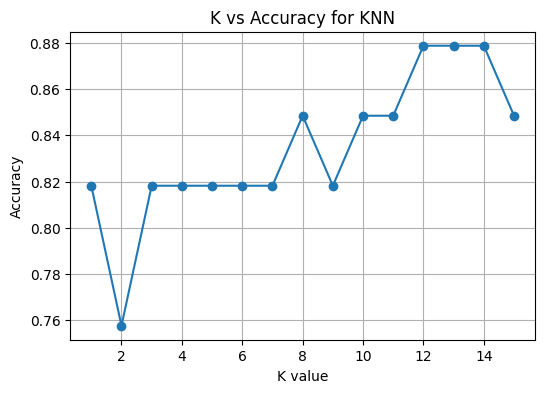

In [13]:
# Range of K values
k_values = range(1, 16)
accuracies = []

for k in k_values:
    y_pred = knn_predict_batch(X_train, y_train, X_test, k=k)
    accuracy = np.mean(y_pred == y_test)
    accuracies.append(accuracy)

# Plot K vs Accuracy
plt.figure(figsize=(6,4))
plt.plot(k_values, accuracies, marker='o')
plt.xlabel("K value")
plt.ylabel("Accuracy")
plt.title("K vs Accuracy for KNN")
plt.grid(True)
plt.show()
